In [25]:
import pandas as pd
import numpy as np

train = pd.read_csv('./drive/My Drive/wjsfur/train.csv')

In [26]:
train.head()

,num_date_time,건물번호,일시,기온(°C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),전력소비량(kWh)
0,1_20240601 00,1,20240601 00,18.3,0.0,2.6,82.0,0.0,0.0,5794.80
1,1_20240601 01,1,20240601 01,18.3,0.0,2.7,82.0,0.0,0.0,5591.85
2,1_20240601 02,1,20240601 02,18.1,0.0,2.6,80.0,0.0,0.0,5338.17
3,1_20240601 03,1,20240601 03,18.0,0.0,2.6,81.0,0.0,0.0,4554.42
4,1_20240601 04,1,20240601 04,17.8,0.0,1.3,81.0,0.0,0.0,3602.25


In [27]:
train_list = []
for i in range(1,101):
    train_list.append(train[train['건물번호']==i])
df = train_list[0]

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

def visual_df(df):
    # 일시(datetime) 변환
    df['일시'] = pd.to_datetime(df['일시'], format='%Y%m%d %H')

    # 전력소비량 시각화
    plt.figure(figsize=(14, 5))
    plt.plot(df['일시'], df['전력소비량(kWh)'], color='tab:blue')
    plt.title("Hourly Power Consumption", fontsize=16)
    plt.xlabel("Time")
    plt.ylabel("Power Consumption (kWh)")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.show()

In [29]:
for df in train_list:
    print(set(df['건물번호']))
    visual_df(df)

Output hidden; open in https://colab.research.google.com to view.

## 이상치 탐지

In [36]:
from statsmodels.tsa.seasonal import STL
import numpy as np
import pandas as pd

for i in range(len(train_list)):
    # 1) 복사본 생성하여 SettingWithCopyWarning 방지
    df = train_list[i].copy()
    original_length = len(df)

    # -------------------------
    # 2) 전력소비량이 0인 값을 NaN으로 변경 (완전 제거 대신)
    # -------------------------
    zero_mask = df['전력소비량(kWh)'] == 0
    df.loc[zero_mask, '전력소비량(kWh)'] = np.nan
    zero_count = zero_mask.sum()

    # 유효한 데이터만으로 이상치 탐지 진행
    df_valid = df.dropna(subset=['전력소비량(kWh)']).reset_index(drop=True)

    # -------------------------
    # 3) STL 기반 이상치 탐지
    # -------------------------
    if len(df_valid) < 48:  # 최소 2일치 데이터 필요
        print(f"건물번호 {df['건물번호'].iloc[0]} → 데이터 부족으로 STL 생략, 선형 보간만 적용")
        # 0값들을 선형 보간으로 처리
        df = df.sort_values('일시').reset_index(drop=True)
        df['전력소비량(kWh)'] = df['전력소비량(kWh)'].interpolate(method='linear')
        df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')

        train_list[i] = df
        continue

    # 인덱스를 일시로 설정하되 중복 제거
    df_temp = df_valid.set_index('일시')
    df_temp = df_temp[~df_temp.index.duplicated(keep='first')]  # 중복 인덱스 제거
    series = df_temp['전력소비량(kWh)']

    try:
        stl = STL(series, period=24)  # 하루 주기
        res = stl.fit()

        resid = res.resid
        z = (resid - resid.mean()) / resid.std()
        outliers_stl_idx = series.index[np.abs(z) > 3]   # STL + z-score 이상치 인덱스

    except Exception as e:
        print(f"건물번호 {df['건물번호'].iloc[0]} → STL 처리 오류: {e}")
        outliers_stl_idx = pd.Index([])

    # -------------------------
    # 4) IQR 기반 이상치 탐지
    # -------------------------
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers_iqr_idx = series.index[(series < lower_bound) | (series > upper_bound)]

    # -------------------------
    # 5) 두 방식 결과 합치기
    # -------------------------
    all_outlier_idx = pd.Index(list(set(outliers_stl_idx) | set(outliers_iqr_idx)))

    # -------------------------
    # 6) 이상치를 NaN으로 변경 (제거하지 않고 보간 준비)
    # -------------------------
    outlier_mask = df['일시'].isin(all_outlier_idx)
    df.loc[outlier_mask, '전력소비량(kWh)'] = np.nan
    outliers_count = outlier_mask.sum()

    # -------------------------
    # 7) 보간법으로 결측값 채우기
    # -------------------------
    # 시계열 순서 보장을 위해 일시 기준으로 정렬
    df = df.sort_values('일시').reset_index(drop=True)

    # 선형 보간 적용
    df['전력소비량(kWh)'] = df['전력소비량(kWh)'].interpolate(method='linear')

    # 시작이나 끝에 NaN이 남아있으면 앞/뒤 값으로 채우기
    df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')

    # 그래도 NaN이 남아있으면 평균값으로 채우기
    if df['전력소비량(kWh)'].isna().any():
        mean_value = df['전력소비량(kWh)'].mean()
        df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(mean_value)

    # train_list 갱신
    train_list[i] = df

    # 결과 확인용 출력
    total_interpolated = zero_count + outliers_count
    print(f"건물번호 {df['건물번호'].iloc[0]} → STL:{len(outliers_stl_idx)}개, IQR:{len(outliers_iqr_idx)}개")
    print(f"  - 0값:{zero_count}개, 이상치:{outliers_count}개, 총 보간처리:{total_interpolated}개")
    print(f"  - 최종 데이터 길이: {len(df)}개 (원본: {original_length}개)")

/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 1 → STL:5개, IQR:1개
  - 0값:0개, 이상치:6개, 총 보간처리:6개
  - 최종 데이터 길이: 2011개 (원본: 2011개)
건물번호 2 → STL:32개, IQR:1개
  - 0값:0개, 이상치:33개, 총 보간처리:33개
  - 최종 데이터 길이: 1996개 (원본: 1996개)
건물번호 3 → STL:10개, IQR:0개
  - 0값:0개, 이상치:10개, 총 보간처리:10개
  - 최종 데이터 길이: 2028개 (원본: 2028개)
건물번호 4 → STL:7개, IQR:0개
  - 0값:0개, 이상치:7개, 총 보간처리:7개
  - 최종 데이터 길이: 2032개 (원본: 2032개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 5 → STL:10개, IQR:0개
  - 0값:0개, 이상치:10개, 총 보간처리:10개
  - 최종 데이터 길이: 2032개 (원본: 2032개)
건물번호 6 → STL:2개, IQR:0개
  - 0값:0개, 이상치:2개, 총 보간처리:2개
  - 최종 데이터 길이: 2036개 (원본: 2036개)
건물번호 7 → STL:42개, IQR:0개
  - 0값:0개, 이상치:42개, 총 보간처리:42개
  - 최종 데이터 길이: 1989개 (원본: 1989개)
건물번호 8 → STL:27개, IQR:41개
  - 0값:0개, 이상치:61개, 총 보간처리:61개
  - 최종 데이터 길이: 1984개 (원본: 1984개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 9 → STL:16개, IQR:0개
  - 0값:0개, 이상치:16개, 총 보간처리:16개
  - 최종 데이터 길이: 2018개 (원본: 2018개)
건물번호 10 → STL:25개, IQR:0개
  - 0값:0개, 이상치:25개, 총 보간처리:25개
  - 최종 데이터 길이: 2021개 (원본: 2021개)
건물번호 11 → STL:30개, IQR:0개
  - 0값:0개, 이상치:30개, 총 보간처리:30개
  - 최종 데이터 길이: 2021개 (원본: 2021개)
건물번호 12 → STL:16개, IQR:0개
  - 0값:0개, 이상치:16개, 총 보간처리:16개
  - 최종 데이터 길이: 2026개 (원본: 2026개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 13 → STL:19개, IQR:13개
  - 0값:0개, 이상치:27개, 총 보간처리:27개
  - 최종 데이터 길이: 1959개 (원본: 1959개)
건물번호 14 → STL:6개, IQR:0개
  - 0값:0개, 이상치:6개, 총 보간처리:6개
  - 최종 데이터 길이: 2030개 (원본: 2030개)
건물번호 15 → STL:12개, IQR:104개
  - 0값:0개, 이상치:105개, 총 보간처리:105개
  - 최종 데이터 길이: 1918개 (원본: 1918개)
건물번호 16 → STL:9개, IQR:0개
  - 0값:0개, 이상치:9개, 총 보간처리:9개
  - 최종 데이터 길이: 2036개 (원본: 2036개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 17 → STL:7개, IQR:0개
  - 0값:0개, 이상치:7개, 총 보간처리:7개
  - 최종 데이터 길이: 2012개 (원본: 2012개)
건물번호 18 → STL:20개, IQR:0개
  - 0값:0개, 이상치:20개, 총 보간처리:20개
  - 최종 데이터 길이: 1998개 (원본: 1998개)
건물번호 19 → STL:61개, IQR:0개
  - 0값:0개, 이상치:61개, 총 보간처리:61개
  - 최종 데이터 길이: 2005개 (원본: 2005개)
건물번호 20 → STL:0개, IQR:0개
  - 0값:0개, 이상치:0개, 총 보간처리:0개
  - 최종 데이터 길이: 2040개 (원본: 2040개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 21 → STL:13개, IQR:0개
  - 0값:0개, 이상치:13개, 총 보간처리:13개
  - 최종 데이터 길이: 2020개 (원본: 2020개)
건물번호 22 → STL:22개, IQR:2개
  - 0값:0개, 이상치:22개, 총 보간처리:22개
  - 최종 데이터 길이: 2008개 (원본: 2008개)
건물번호 23 → STL:30개, IQR:292개
  - 0값:0개, 이상치:292개, 총 보간처리:292개
  - 최종 데이터 길이: 1788개 (원본: 1788개)
건물번호 24 → STL:15개, IQR:2개
  - 0값:0개, 이상치:17개, 총 보간처리:17개
  - 최종 데이터 길이: 2005개 (원본: 2005개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 25 → STL:43개, IQR:11개
  - 0값:0개, 이상치:49개, 총 보간처리:49개
  - 최종 데이터 길이: 1996개 (원본: 1996개)
건물번호 26 → STL:37개, IQR:0개
  - 0값:0개, 이상치:37개, 총 보간처리:37개
  - 최종 데이터 길이: 2014개 (원본: 2014개)
건물번호 27 → STL:57개, IQR:0개
  - 0값:0개, 이상치:57개, 총 보간처리:57개
  - 최종 데이터 길이: 1981개 (원본: 1981개)
건물번호 28 → STL:41개, IQR:0개
  - 0값:0개, 이상치:41개, 총 보간처리:41개
  - 최종 데이터 길이: 2015개 (원본: 2015개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 29 → STL:64개, IQR:0개
  - 0값:0개, 이상치:64개, 총 보간처리:64개
  - 최종 데이터 길이: 1981개 (원본: 1981개)
건물번호 30 → STL:66개, IQR:32개
  - 0값:0개, 이상치:77개, 총 보간처리:77개
  - 최종 데이터 길이: 1978개 (원본: 1978개)
건물번호 31 → STL:47개, IQR:0개
  - 0값:0개, 이상치:47개, 총 보간처리:47개
  - 최종 데이터 길이: 2018개 (원본: 2018개)
건물번호 32 → STL:58개, IQR:0개
  - 0값:0개, 이상치:58개, 총 보간처리:58개
  - 최종 데이터 길이: 1988개 (원본: 1988개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 33 → STL:28개, IQR:0개
  - 0값:0개, 이상치:28개, 총 보간처리:28개
  - 최종 데이터 길이: 2004개 (원본: 2004개)
건물번호 34 → STL:65개, IQR:0개
  - 0값:0개, 이상치:65개, 총 보간처리:65개
  - 최종 데이터 길이: 2006개 (원본: 2006개)
건물번호 35 → STL:3개, IQR:0개
  - 0값:0개, 이상치:3개, 총 보간처리:3개
  - 최종 데이터 길이: 2032개 (원본: 2032개)
건물번호 36 → STL:13개, IQR:1개
  - 0값:0개, 이상치:13개, 총 보간처리:13개
  - 최종 데이터 길이: 2014개 (원본: 2014개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 37 → STL:2개, IQR:0개
  - 0값:0개, 이상치:2개, 총 보간처리:2개
  - 최종 데이터 길이: 2037개 (원본: 2037개)
건물번호 38 → STL:7개, IQR:0개
  - 0값:0개, 이상치:7개, 총 보간처리:7개
  - 최종 데이터 길이: 2027개 (원본: 2027개)
건물번호 39 → STL:2개, IQR:0개
  - 0값:0개, 이상치:2개, 총 보간처리:2개
  - 최종 데이터 길이: 2038개 (원본: 2038개)
건물번호 40 → STL:71개, IQR:0개
  - 0값:0개, 이상치:71개, 총 보간처리:71개
  - 최종 데이터 길이: 1987개 (원본: 1987개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 41 → STL:14개, IQR:0개
  - 0값:0개, 이상치:14개, 총 보간처리:14개
  - 최종 데이터 길이: 2027개 (원본: 2027개)
건물번호 42 → STL:1개, IQR:0개
  - 0값:0개, 이상치:1개, 총 보간처리:1개
  - 최종 데이터 길이: 2035개 (원본: 2035개)
건물번호 43 → STL:32개, IQR:3개
  - 0값:0개, 이상치:34개, 총 보간처리:34개
  - 최종 데이터 길이: 2015개 (원본: 2015개)
건물번호 44 → STL:8개, IQR:0개
  - 0값:0개, 이상치:8개, 총 보간처리:8개
  - 최종 데이터 길이: 2031개 (원본: 2031개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 45 → STL:64개, IQR:0개
  - 0값:0개, 이상치:64개, 총 보간처리:64개
  - 최종 데이터 길이: 2004개 (원본: 2004개)
건물번호 46 → STL:12개, IQR:16개
  - 0값:0개, 이상치:25개, 총 보간처리:25개
  - 최종 데이터 길이: 1988개 (원본: 1988개)
건물번호 47 → STL:7개, IQR:0개
  - 0값:0개, 이상치:7개, 총 보간처리:7개
  - 최종 데이터 길이: 2031개 (원본: 2031개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 48 → STL:13개, IQR:3개
  - 0값:0개, 이상치:16개, 총 보간처리:16개
  - 최종 데이터 길이: 1998개 (원본: 1998개)
건물번호 49 → STL:7개, IQR:0개
  - 0값:0개, 이상치:7개, 총 보간처리:7개
  - 최종 데이터 길이: 2033개 (원본: 2033개)
건물번호 50 → STL:1개, IQR:0개
  - 0값:0개, 이상치:1개, 총 보간처리:1개
  - 최종 데이터 길이: 2039개 (원본: 2039개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 51 → STL:3개, IQR:0개
  - 0값:0개, 이상치:3개, 총 보간처리:3개
  - 최종 데이터 길이: 2037개 (원본: 2037개)
건물번호 52 → STL:36개, IQR:17개
  - 0값:0개, 이상치:40개, 총 보간처리:40개
  - 최종 데이터 길이: 1860개 (원본: 1860개)
건물번호 53 → STL:10개, IQR:3개
  - 0값:0개, 이상치:11개, 총 보간처리:11개
  - 최종 데이터 길이: 2006개 (원본: 2006개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 54 → STL:60개, IQR:0개
  - 0값:0개, 이상치:60개, 총 보간처리:60개
  - 최종 데이터 길이: 1986개 (원본: 1986개)
건물번호 55 → STL:25개, IQR:1개
  - 0값:0개, 이상치:26개, 총 보간처리:26개
  - 최종 데이터 길이: 2013개 (원본: 2013개)
건물번호 56 → STL:11개, IQR:0개
  - 0값:0개, 이상치:11개, 총 보간처리:11개
  - 최종 데이터 길이: 2016개 (원본: 2016개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 57 → STL:54개, IQR:0개
  - 0값:0개, 이상치:54개, 총 보간처리:54개
  - 최종 데이터 길이: 1997개 (원본: 1997개)
건물번호 58 → STL:41개, IQR:0개
  - 0값:0개, 이상치:41개, 총 보간처리:41개
  - 최종 데이터 길이: 2022개 (원본: 2022개)
건물번호 59 → STL:57개, IQR:0개
  - 0값:0개, 이상치:57개, 총 보간처리:57개
  - 최종 데이터 길이: 1988개 (원본: 1988개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 60 → STL:8개, IQR:0개
  - 0값:0개, 이상치:8개, 총 보간처리:8개
  - 최종 데이터 길이: 2027개 (원본: 2027개)
건물번호 61 → STL:78개, IQR:0개
  - 0값:0개, 이상치:78개, 총 보간처리:78개
  - 최종 데이터 길이: 1995개 (원본: 1995개)
건물번호 62 → STL:0개, IQR:0개
  - 0값:0개, 이상치:0개, 총 보간처리:0개
  - 최종 데이터 길이: 2038개 (원본: 2038개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 63 → STL:65개, IQR:0개
  - 0값:0개, 이상치:65개, 총 보간처리:65개
  - 최종 데이터 길이: 1983개 (원본: 1983개)
건물번호 64 → STL:42개, IQR:29개
  - 0값:0개, 이상치:57개, 총 보간처리:57개
  - 최종 데이터 길이: 1867개 (원본: 1867개)
건물번호 65 → STL:32개, IQR:0개
  - 0값:0개, 이상치:32개, 총 보간처리:32개
  - 최종 데이터 길이: 1992개 (원본: 1992개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 66 → STL:6개, IQR:0개
  - 0값:0개, 이상치:6개, 총 보간처리:6개
  - 최종 데이터 길이: 2025개 (원본: 2025개)
건물번호 67 → STL:15개, IQR:0개
  - 0값:0개, 이상치:15개, 총 보간처리:15개
  - 최종 데이터 길이: 1969개 (원본: 1969개)
건물번호 68 → STL:0개, IQR:0개
  - 0값:0개, 이상치:0개, 총 보간처리:0개
  - 최종 데이터 길이: 2036개 (원본: 2036개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 69 → STL:0개, IQR:0개
  - 0값:0개, 이상치:0개, 총 보간처리:0개
  - 최종 데이터 길이: 2038개 (원본: 2038개)
건물번호 70 → STL:7개, IQR:0개
  - 0값:0개, 이상치:7개, 총 보간처리:7개
  - 최종 데이터 길이: 2009개 (원본: 2009개)
건물번호 71 → STL:49개, IQR:14개
  - 0값:0개, 이상치:58개, 총 보간처리:58개
  - 최종 데이터 길이: 2000개 (원본: 2000개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 72 → STL:7개, IQR:0개
  - 0값:0개, 이상치:7개, 총 보간처리:7개
  - 최종 데이터 길이: 2028개 (원본: 2028개)
건물번호 73 → STL:85개, IQR:0개
  - 0값:0개, 이상치:85개, 총 보간처리:85개
  - 최종 데이터 길이: 2007개 (원본: 2007개)
건물번호 74 → STL:47개, IQR:0개
  - 0값:0개, 이상치:47개, 총 보간처리:47개
  - 최종 데이터 길이: 2001개 (원본: 2001개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 75 → STL:8개, IQR:0개
  - 0값:0개, 이상치:8개, 총 보간처리:8개
  - 최종 데이터 길이: 2024개 (원본: 2024개)
건물번호 76 → STL:31개, IQR:0개
  - 0값:0개, 이상치:31개, 총 보간처리:31개
  - 최종 데이터 길이: 2024개 (원본: 2024개)
건물번호 77 → STL:24개, IQR:0개
  - 0값:0개, 이상치:24개, 총 보간처리:24개
  - 최종 데이터 길이: 2001개 (원본: 2001개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 78 → STL:34개, IQR:0개
  - 0값:0개, 이상치:34개, 총 보간처리:34개
  - 최종 데이터 길이: 2016개 (원본: 2016개)
건물번호 79 → STL:68개, IQR:0개
  - 0값:0개, 이상치:68개, 총 보간처리:68개
  - 최종 데이터 길이: 2005개 (원본: 2005개)
건물번호 80 → STL:7개, IQR:0개
  - 0값:0개, 이상치:7개, 총 보간처리:7개
  - 최종 데이터 길이: 2018개 (원본: 2018개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 81 → STL:34개, IQR:2개
  - 0값:0개, 이상치:34개, 총 보간처리:34개
  - 최종 데이터 길이: 1941개 (원본: 1941개)
건물번호 82 → STL:48개, IQR:0개
  - 0값:0개, 이상치:48개, 총 보간처리:48개
  - 최종 데이터 길이: 2016개 (원본: 2016개)
건물번호 83 → STL:11개, IQR:0개
  - 0값:0개, 이상치:11개, 총 보간처리:11개
  - 최종 데이터 길이: 2023개 (원본: 2023개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 84 → STL:27개, IQR:0개
  - 0값:0개, 이상치:27개, 총 보간처리:27개
  - 최종 데이터 길이: 2023개 (원본: 2023개)
건물번호 85 → STL:29개, IQR:0개
  - 0값:0개, 이상치:29개, 총 보간처리:29개
  - 최종 데이터 길이: 2014개 (원본: 2014개)
건물번호 86 → STL:0개, IQR:0개
  - 0값:0개, 이상치:0개, 총 보간처리:0개
  - 최종 데이터 길이: 2040개 (원본: 2040개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


건물번호 87 → STL:33개, IQR:7개
  - 0값:0개, 이상치:36개, 총 보간처리:36개
  - 최종 데이터 길이: 2005개 (원본: 2005개)
건물번호 88 → STL:66개, IQR:0개
  - 0값:0개, 이상치:66개, 총 보간처리:66개
  - 최종 데이터 길이: 2014개 (원본: 2014개)
건물번호 89 → STL:38개, IQR:0개
  - 0값:0개, 이상치:38개, 총 보간처리:38개
  - 최종 데이터 길이: 1996개 (원본: 1996개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 90 → STL:1개, IQR:0개
  - 0값:0개, 이상치:1개, 총 보간처리:1개
  - 최종 데이터 길이: 2038개 (원본: 2038개)
건물번호 91 → STL:32개, IQR:3개
  - 0값:0개, 이상치:33개, 총 보간처리:33개
  - 최종 데이터 길이: 2011개 (원본: 2011개)
건물번호 92 → STL:39개, IQR:0개
  - 0값:0개, 이상치:39개, 총 보간처리:39개
  - 최종 데이터 길이: 2005개 (원본: 2005개)
건물번호 93 → STL:44개, IQR:2개
  - 0값:0개, 이상치:45개, 총 보간처리:45개
  - 최종 데이터 길이: 2015개 (원본: 2015개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(

건물번호 94 → STL:18개, IQR:11개
  - 0값:0개, 이상치:27개, 총 보간처리:27개
  - 최종 데이터 길이: 2012개 (원본: 2012개)
건물번호 95 → STL:49개, IQR:0개
  - 0값:0개, 이상치:49개, 총 보간처리:49개
  - 최종 데이터 길이: 1989개 (원본: 1989개)
건물번호 96 → STL:23개, IQR:4개
  - 0값:0개, 이상치:26개, 총 보간처리:26개
  - 최종 데이터 길이: 1995개 (원본: 1995개)
건물번호 97 → STL:8개, IQR:0개
  - 0값:0개, 이상치:8개, 총 보간처리:8개
  - 최종 데이터 길이: 2021개 (원본: 2021개)
건물번호 98 → STL:29개, IQR:0개
  - 0값:0개, 이상치:29개, 총 보간처리:29개
  - 최종 데이터 길이: 1990개 (원본: 1990개)
건물번호 99 → STL:33개, IQR:3개
  - 0값:0개, 이상치:36개, 총 보간처리:36개
  - 최종 데이터 길이: 1995개 (원본: 1995개)
건물번호 100 → STL:29개, IQR:0개
  - 0값:0개, 이상치:29개, 총 보간처리:29개
  - 최종 데이터 길이: 2002개 (원본: 2002개)


/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')
/tmp/ipython-input-2349750497.py:84: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['전력소비량(kWh)'] = df['전력소비량(kWh)'].fillna(method='bfill').fillna(method='ffill')


In [37]:
cnt=0
for df in train_list:
    cnt += len(df)
204000 - cnt

3497

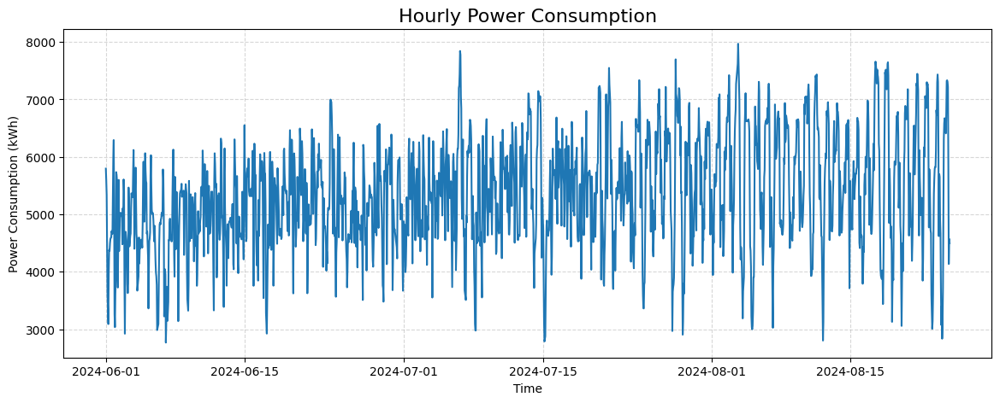

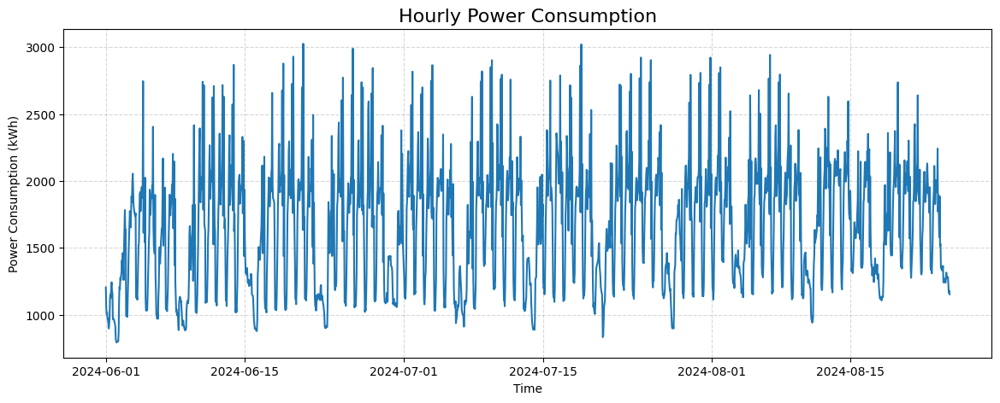

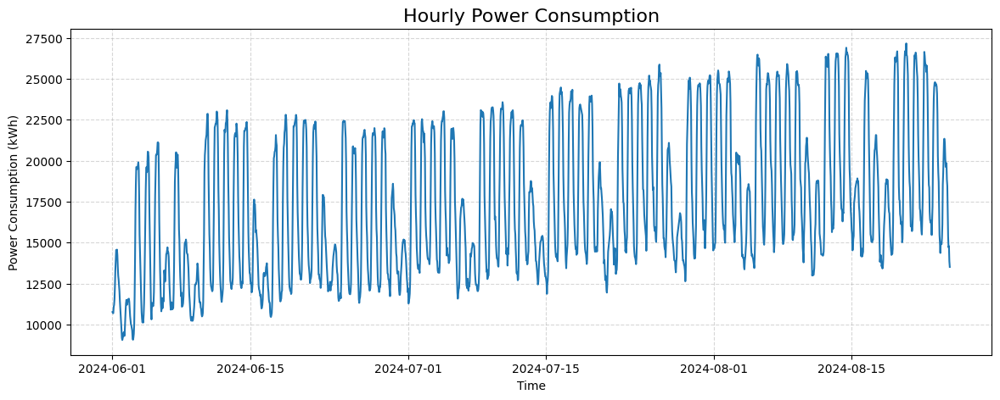

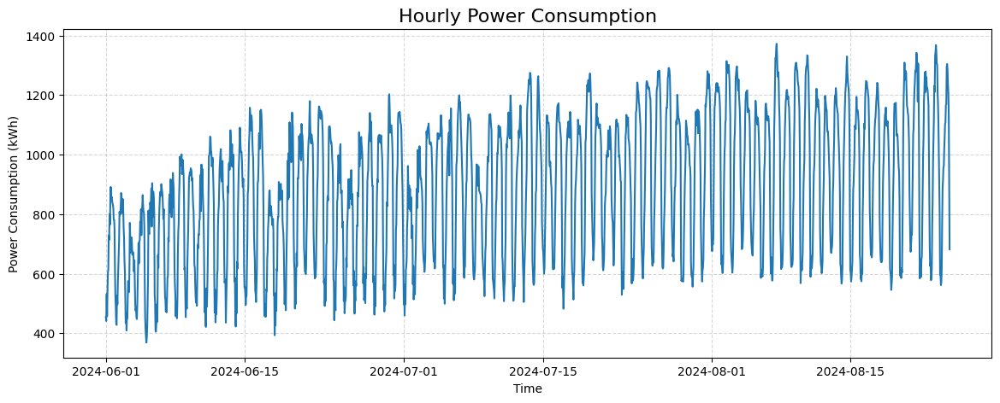

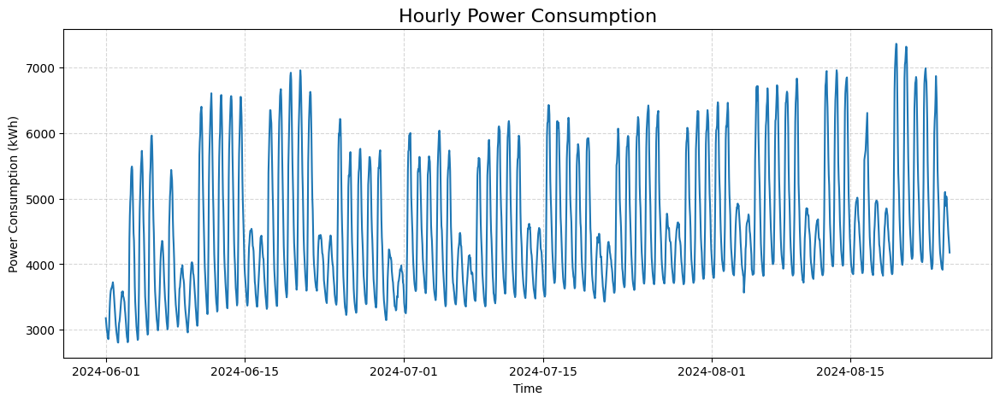

...

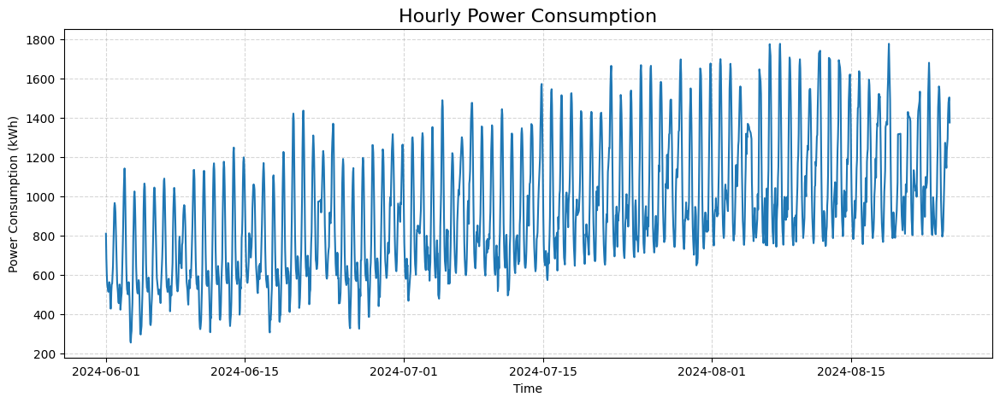

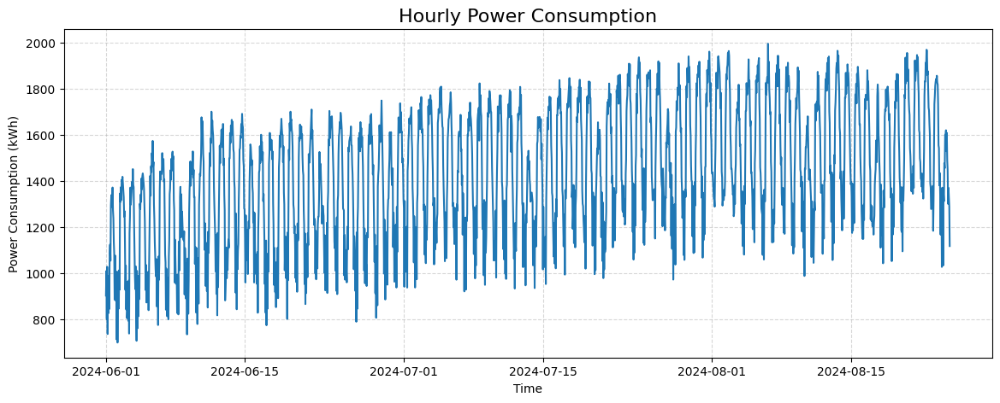

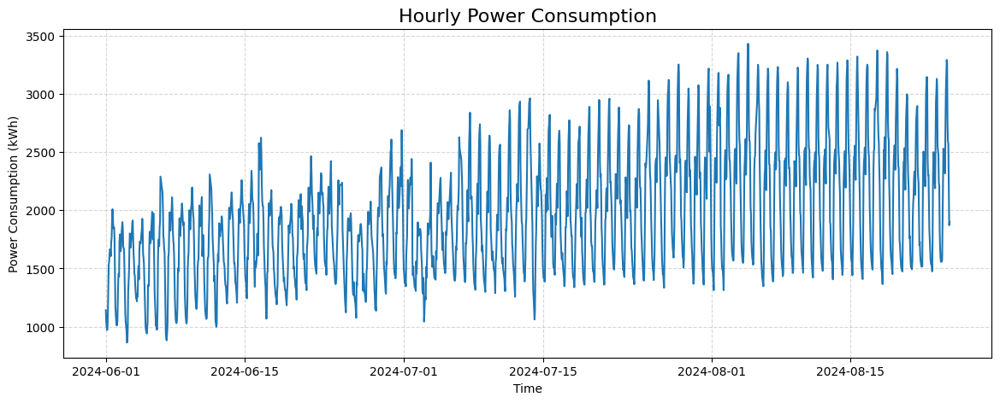

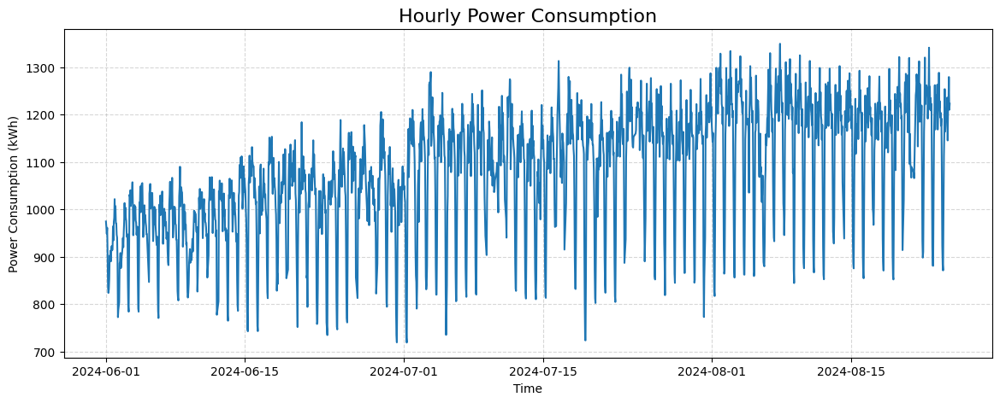

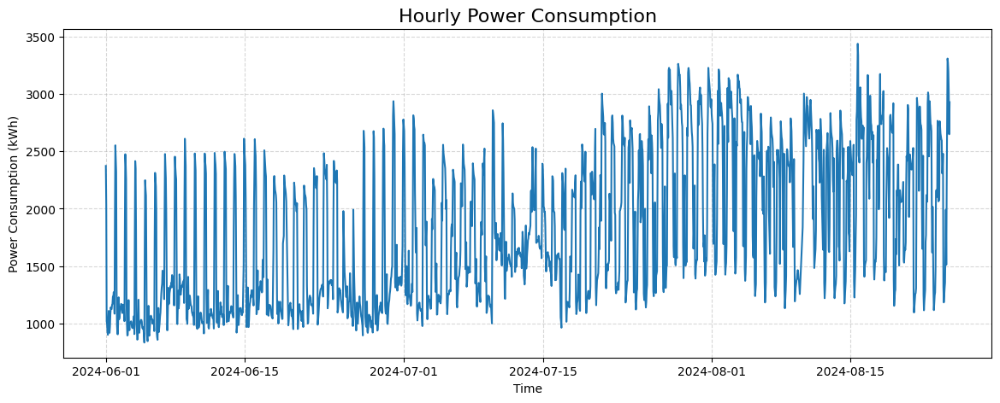

In [38]:
for df in train_list:
    visual_df(df)